### Notebook for the deconvolution of 10X Visium lung sample using `cell2location`

- **Developed by**: Carlos Talavera-López Ph.D
- **Institute of Computational Biology - COmputational Health Centre - Helmholtz Munchen**
- v221205

### Load required modules

In [1]:
import scvi
import anndata
import numpy as np
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

Global seed set to 0
/home/cartalop/mambaforge/envs/c2l/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/cartalop/mambaforge/envs/c2l/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
os.environ["THEANO_FLAGS"] = 'device = cuda,floatX = float32,force_device = True'
import cell2location

### Set up working environment

In [3]:
%config InlineBackend.figure_format = 'retina'
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}

In [4]:
results_folder = '/home/cartalop/data/carlos/single_cell/autotalker/public_datasets/meyer_lung/c2l/'
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

In [5]:
plt.show()

sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'svg', fontsize = 8)


-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                 9.2.0
absl                NA
asttokens           NA
attr                22.1.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
brotli              NA
cell2location       NA
certifi             2022.09.24
cffi                1.15.1
charset_normalizer  2.1.1
chex                0.1.5
contextlib2         NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.4
decorator           5.1.1
deprecate           0.3.2
docrep              0.3.2
entrypoints         0.4
executing           1.2.0
flax                0.6.2
fsspec              2022.11.0
google              NA
h5py                3.7.0
hypergeom_ufunc     NA
idna                3.4
igraph              0.10.2
ipykernel           6.17.1
ipywidgets          8.0.2
jax                 0.3.25
jaxlib              0.3.25
jedi                0.18.2
joblib              1.2.0
kiwisolver          1.4.4
leidena

### Load Visium sample

- The sample has already been formatted into an `anndata` object by the authors

In [6]:
adata_vis = sc.read_h5ad('/home/cartalop/data/carlos/single_cell/autotalker/public_datasets/meyer_lung/6332STDY10289520.h5ad')
adata_vis.obs['sample'] = '6332STDY10289520'
adata_vis

AnnData object with n_obs × n_vars = 1956 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'clusters', 'annotation', 'SLT: Alveolar fibro', 'SLT: Interm fibro', 'SLT: Mid fibro', 'SLT: Pericyte', 'SLT: Adventitial fibro', 'SLT: Vascular SMC 1', 'SLT: Myofibro 3', 'SLT: Vascular SMC 2', 'SLT: Airway fibro', 'SLT: Late mesothelial', 'SLT: Myofibro 2', 'SLT: Myofibro 1', 'SLT: SEMA3E+ mid fibro', 'SLT: Late airway SMC', 'SLT: Early airway SMC 1', 'SLT: Resting chondrocyte', 'SLT: ASPN+ chondrocyte', 'SLT: Interm chondrocyte', 'SLT: Early airway SMC 2', 'SLT: Mid mesothelial', 'SLT: SEMA3E+ early fibro', 'SLT: Late tip', 'SLT: Club', 'SLT: Late airway progenitor', 'SLT: Squamous', 'SLT: AT1', 'SLT: AT2', 'SLT: Secretory 2', 'SLT: SMG', 'SLT: Late stalk', 'SLT: Secretory 3', 'SLT: Pulmonary neuroendocrine', 'SLT: Proximal basal', 'SLT: Secretory 1', 'SLT: GHRL+ neuroendocrine', 'SLT: NEUROD1+ pulmonary neuroendocrine', 'SLT: Secretory progenitors', 'SLT: Late basal', 'SLT: Mid basal'

In [7]:
adata_vis.obs.head()

,in_tissue,array_row,array_col,clusters,annotation,SLT: Alveolar fibro,SLT: Interm fibro,SLT: Mid fibro,SLT: Pericyte,SLT: Adventitial fibro,...,SLT: Mesenchymal 1,SLT: Early fibro,SLT: Mid tip,SLT: Early airway progenitor,SLT: MUC5AC+ ASCL1+ progenitor,SLT: KCNIP4+ neuron,SLT: PCP4+ neuron,SLT: Proliferating Schwann,SLT: Early Schwann,sample
AAACAATCTACTAGCA-1,1,3,43,3,Adventitial fibro,0.092374,0.187242,0.010578,0.002338,0.443903,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6332STDY10289520
AAACACCAATAACTGC-1,1,59,19,5,Definitive erythrocyte,0.009854,0.081271,0.006057,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6332STDY10289520
AAACAGCTTTCAGAAG-1,1,43,9,1,DC2,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6332STDY10289520
AAACAGGGTCTATATT-1,1,47,13,3,Mid fibro,0.092844,0.017269,0.295410,0.068887,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6332STDY10289520
AAACAGTGTTCCTGGG-1,1,73,43,0,SPP1+ MΦ,0.007505,0.075983,0.005130,0.000000,0.141725,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6332STDY10289520


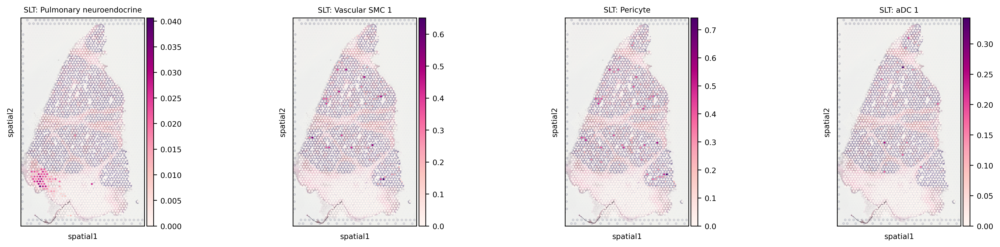

In [8]:
sc.pl.spatial(adata_vis, color = ['SLT: Pulmonary neuroendocrine', 'SLT: Vascular SMC 1', 'SLT: Pericyte', 'SLT: aDC 1'])

- Remove mitochondrial genes for downstream analysis

In [9]:
adata_vis.var['MT_gene'] = [gene.startswith('MT-') for gene in adata_vis.var_names]
adata_vis.obsm['MT'] = adata_vis[:, adata_vis.var['MT_gene'].values].X.toarray()
adata_vis = adata_vis[:, ~adata_vis.var['MT_gene'].values]
adata_vis

View of AnnData object with n_obs × n_vars = 1956 × 33525
    obs: 'in_tissue', 'array_row', 'array_col', 'clusters', 'annotation', 'SLT: Alveolar fibro', 'SLT: Interm fibro', 'SLT: Mid fibro', 'SLT: Pericyte', 'SLT: Adventitial fibro', 'SLT: Vascular SMC 1', 'SLT: Myofibro 3', 'SLT: Vascular SMC 2', 'SLT: Airway fibro', 'SLT: Late mesothelial', 'SLT: Myofibro 2', 'SLT: Myofibro 1', 'SLT: SEMA3E+ mid fibro', 'SLT: Late airway SMC', 'SLT: Early airway SMC 1', 'SLT: Resting chondrocyte', 'SLT: ASPN+ chondrocyte', 'SLT: Interm chondrocyte', 'SLT: Early airway SMC 2', 'SLT: Mid mesothelial', 'SLT: SEMA3E+ early fibro', 'SLT: Late tip', 'SLT: Club', 'SLT: Late airway progenitor', 'SLT: Squamous', 'SLT: AT1', 'SLT: AT2', 'SLT: Secretory 2', 'SLT: SMG', 'SLT: Late stalk', 'SLT: Secretory 3', 'SLT: Pulmonary neuroendocrine', 'SLT: Proximal basal', 'SLT: Secretory 1', 'SLT: GHRL+ neuroendocrine', 'SLT: NEUROD1+ pulmonary neuroendocrine', 'SLT: Secretory progenitors', 'SLT: Late basal', 'SLT: Mi

### Load scRNA-Seq reference

In [10]:
adata_ref = sc.read_h5ad('/home/cartalop/data/carlos/single_cell/lung/hlca/HLCA_raw_100K_subset.h5ad')
adata_ref

AnnData object with n_obs × n_vars = 100000 × 28527
    obs: 'sample', 'ann_level_4', 'sequencing_platform', 'subject_ID'
    var: 'gene_symbols', 'gene_ids'

- Check if `anndata.X` is raw

In [11]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

In [12]:
X_is_raw(adata_ref)

True

### Select informative genes in reference for deconvolutrion

/home/cartalop/mambaforge/envs/c2l/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


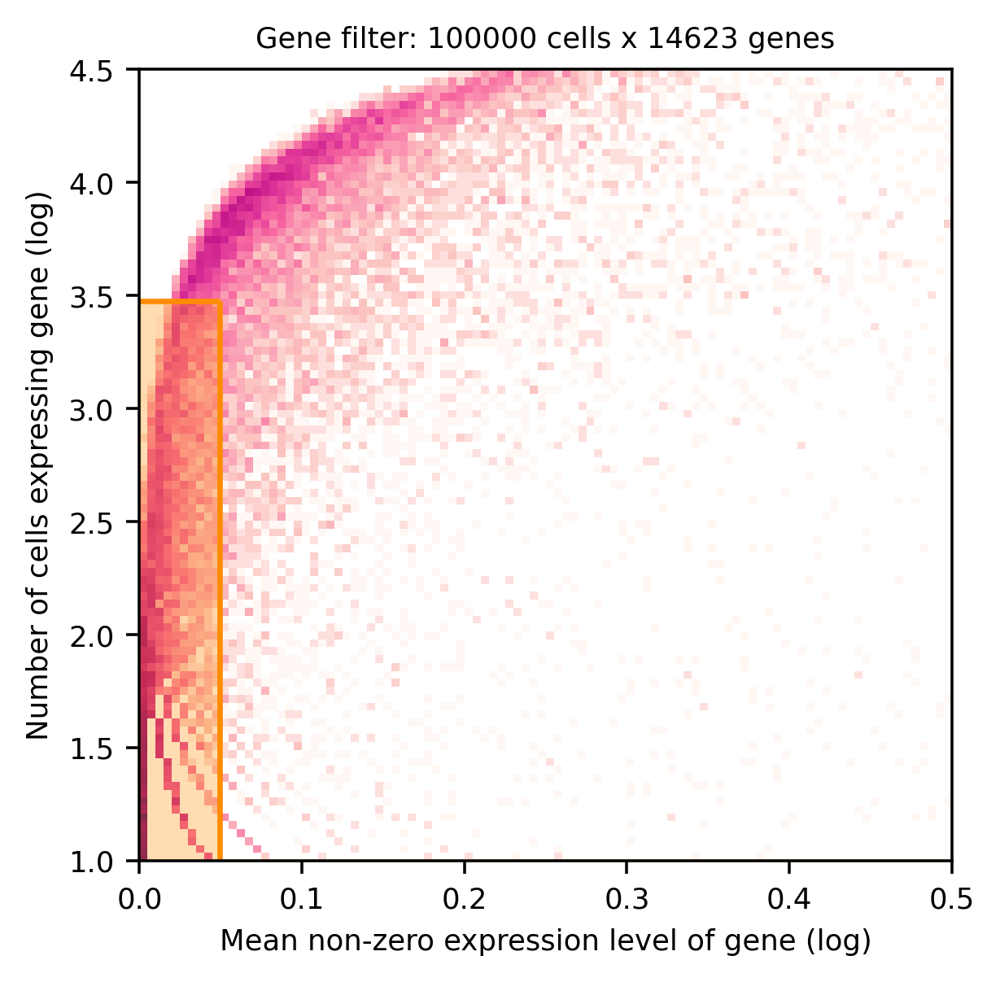

In [13]:
from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_ref, cell_count_cutoff = 5, cell_percentage_cutoff2 = 0.03, nonz_mean_cutoff = 1.12)

- Filter object using these genes

In [14]:
adata_ref = adata_ref[:, selected].copy()
adata_ref

AnnData object with n_obs × n_vars = 100000 × 14623
    obs: 'sample', 'ann_level_4', 'sequencing_platform', 'subject_ID'
    var: 'gene_symbols', 'gene_ids', 'n_cells', 'nonz_mean'

In [15]:
adata_ref.obs['ann_level_4'].value_counts()

None                         15387
Alveolar macrophages         12984
Interstitial macrophages     11058
Club                          7825
Suprabasal                    5824
Multiciliated                 5751
Classical monocytes           4569
Goblet                        4051
CD8 T cells                   3632
EC general capillary          3588
Non-classical monocytes       2946
DC2                           2868
Transitional Club-AT2         2481
CD4 T cells                   2417
Alveolar fibroblasts          1954
Basal resting                 1576
Adventitial fibroblasts       1574
EC aerocyte capillary         1469
EC venous pulmonary           1189
NK cells                      1038
Pericytes                      875
EC venous systemic             840
Plasma cells                   793
B cells                        640
SMG duct                       522
SMG serous                     509
Peribronchial fibroblasts      437
SMG mucous                     268
Deuterosomal        

### Estimation of reference cell type signatures (NB regression)

In [16]:

from cell2location.models import RegressionModel

RegressionModel.setup_anndata(
    adata = adata_ref,
    batch_key = 'sample',
    labels_key = 'ann_level_4',
    categorical_covariate_keys = ['sequencing_platform']
)
mod = RegressionModel(adata_ref)
mod.view_anndata_setup()

/home/cartalop/mambaforge/envs/c2l/lib/python3.9/site-packages/scvi/data/_utils.py:168: UserWarning: Category 76 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(


Anndata setup with scvi-tools version 0.19.0.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': 'ann_level_4',
│   'categorical_covariate_keys': ['sequencing_platform'],
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │  166   │
│         n_cells          │ 100000 │
│ n_extra_categorical_covs │   1    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   38   │
│          n_vars          │ 14623  │
└──────────────────────────┴────────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │                  adata.X                   │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         ind_x          │           adata.obs['_indices']            │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                       batch State Registry                       
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃     Categories     ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │      356C_0h       │          0          │
│                     │      356C_12h      │          1          │
│                     │      356C_24h      │          2          │
│                     │      356C_72h      │          3          │
│                     │      368C_0h       │          4          │
│                     │      368C_12h      │          5          │
│                     │      368C_24h      │          6          │
│                     │      368C_72h      │          7          │
│                     │      390C_0h       │          8          │
│                     │      390C_12h      │          9          │
│                     │      390C_24h      │         10          │
│                     │      390C_72h      │         11          │
│                     │      7119452       │         12          │
│                     │      7119453       │         13          │
│                     │      7135919       │         14          │
│                     │      7135920       │         15          │
│                     │      7185212       │         16          │
│                     │      7185213       │         17          │
│                     │      7239213       │         18          │
│                     │      7239217       │         19          │
│                     │      7239218       │         20          │
│                     │      7239219       │         21          │
│                     │      7239220       │         22          │
│                     │   D322_Biop_Nas1   │         23          │
│                     │   D322_Biop_Pro1   │         24          │
│                     │   D326_Biop_Int1   │         25          │
│                     │   D326_Biop_Pro1   │         26          │
│                     │   D326_Brus_Dis1   │         27          │
│                     │   D337_Brus_Dis1   │         28          │
│                     │   D339_Biop_Int1   │         29          │
│                     │   D339_Biop_Nas1   │         30          │
│                     │   D339_Biop_Pro1   │         31          │
│                     │   D344_Biop_Int1   │         32          │
│                     │   D344_Biop_Nas1   │         33          │
│                     │   D344_Biop_Pro1   │         34          │
│                     │   D344_Brus_Dis1   │         35          │
│                     │   D353_Biop_Int2   │         36          │
│                     │   D353_Biop_Pro1   │         37          │
│                     │   D353_Brus_Dis1   │         38          │
│                     │   D353_Brus_Nas1   │         39          │
│                     │   D354_Biop_Int2   │         40          │
│                     │   D354_Biop_Pro1   │         41          │
│                     │   D354_Brus_Dis1   │         42          │
│                     │   D363_Biop_Int2   │         43          │
│                     │   D363_Biop_Pro1   │         44          │
│                     │   D363_Brus_Dis1   │         45          │
│                     │   D363_Brus_Nas1   │         46          │
│                     │   D367_Biop_Int1   │         47          │
│                     │   D367_Biop_Pro1   │         48          │
│                     │   D367_Brus_Dis1   │         49          │
│                     │   D367_Brus_Nas1   │         50          │
│                     │   D372_Biop_Int1   │         51          │
│                     │   D372_Biop_Int2   │         52          │
│                     │   D372_Biop_Pro1   │         53          │
│                     │   D372_Brus_Dis1   │         54          │
│                     │   D372_Brus_Nas1   │   

                            labels State Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃        Categories         ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['ann_level_4'] │     AT2 proliferating     │          0          │
│                          │  Adventitial fibroblasts  │          1          │
│                          │   Alveolar fibroblasts    │          2          │
│                          │   Alveolar macrophages    │          3          │
│                          │          B cells          │          4          │
│                          │       Basal resting       │          5          │
│                          │        CD4 T cells        │          6          │
│                          │        CD8 T cells        │          7          │
│                          │    Classical monocytes    │          8          │
│                          │           Club            │          9          │
│                          │            DC1            │         10          │
│                          │            DC2            │         11          │
│                          │       Deuterosomal        │         12          │
│                          │   EC aerocyte capillary   │         13          │
│                          │   EC general capillary    │         14          │
│                          │    EC venous pulmonary    │         15          │
│                          │    EC venous systemic     │         16          │
│                          │          Goblet           │         17          │
│                          │ Interstitial macrophages  │         18          │
│                          │         Ionocyte          │         19          │
│                          │       Migratory DCs       │         20          │
│                          │       Multiciliated       │         21          │
│                          │         NK cells          │         22          │
│                          │      Neuroendocrine       │         23          │
│                          │  Non-classical monocytes  │         24          │
│                          │           None            │         25          │
│                          │ Peribronchial fibroblasts │         26          │
│                          │         Pericytes         │         27          │
│                          │       Plasma cells        │         28          │
│                          │     Plasmacytoid DCs      │         29          │
│                          │         SMG duct          │         30          │
│                          │        SMG mucous         │         31          │
│                          │        SMG serous         │         32          │
│                          │  Subpleural fibroblasts   │         33          │
│                          │        Suprabasal         │         34          │
│                          │   T cells proliferating   │         35          │
│                          │   Transitional Club-AT2   │         36          │
│                          │           Tuft            │         37          │
└──────────────────────────┴───────────────────────────┴─────────────────────┘

                                 extra_categorical_covs State Registry                                 
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃         Source Location          ┃                 Categories                 ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sequencing_platform'] │            Illumina HiSeq 4000             │          0          │
│                                  │            Illumina NextSeq 500            │          1          │
│                                  │           Illumina NovaSeq 6000            │          2          │
│                                  │          Illumina NovaSeq 6000 S1          │          3          │
│                                  │          Illumina NovaSeq 6000 S2          │          4          │
│                                  │          Illumina NovaSeq 6000 S4          │          5          │
│                                  │          Illumina NovaSeq 6000 SP          │          6          │
│                                  │ Illumina NovaSeq 6000; Illumina HiSeq 4000 │          7          │
│                                  │                    nan                     │          8          │
│                                  │                                            │                     │
└──────────────────────────────────┴────────────────────────────────────────────┴─────────────────────┘

In [17]:
mod.train(
    max_epochs = 250,
    batch_size = 2500,
    train_size = 1,
    lr = 0.002,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cartalop/mambaforge/envs/c2l/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 250/250: 100%|██████████| 250/250 [19:01<00:00,  4.52s/it, v_num=1, elbo_train=5.72e+8]

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|██████████| 250/250 [19:01<00:00,  4.56s/it, v_num=1, elbo_train=5.72e+8]


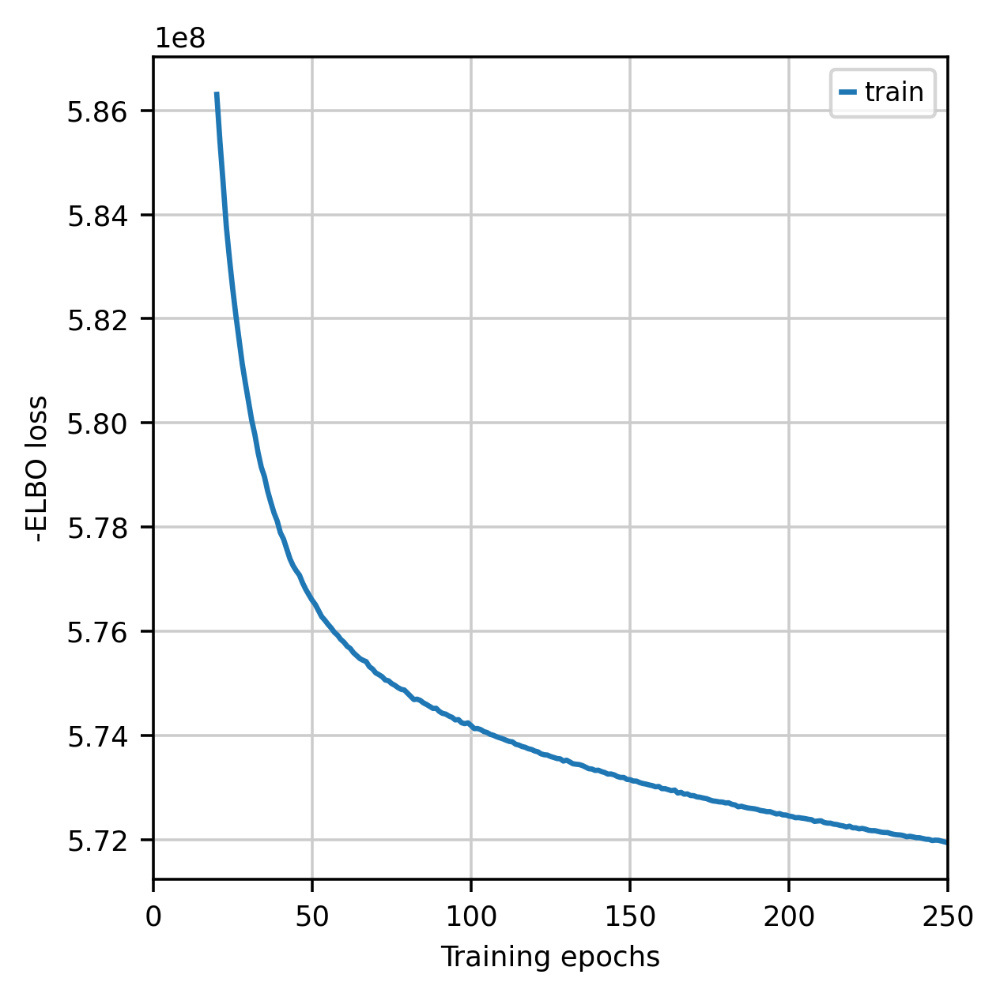

In [18]:
mod.plot_history(20)

### Export cell type abundance estimates

In [19]:
adata_ref = mod.export_posterior(
    adata_ref,
    sample_kwargs = {
        'num_samples': 1000,
        'batch_size': 2500,
        'use_gpu': True
    },
)

Sampling global variables, sample: 100%|██████████| 999/999 [00:10<00:00, 94.11it/s]


### Save model

In [20]:
mod.save(f"{ref_run_name}", overwrite = True)

### Save up annotated Visium object

In [21]:
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref.write(adata_file)
adata_file

'/home/cartalop/data/carlos/single_cell/autotalker/public_datasets/meyer_lung/c2l//reference_signatures/sc.h5ad'

### Evaluate model QC

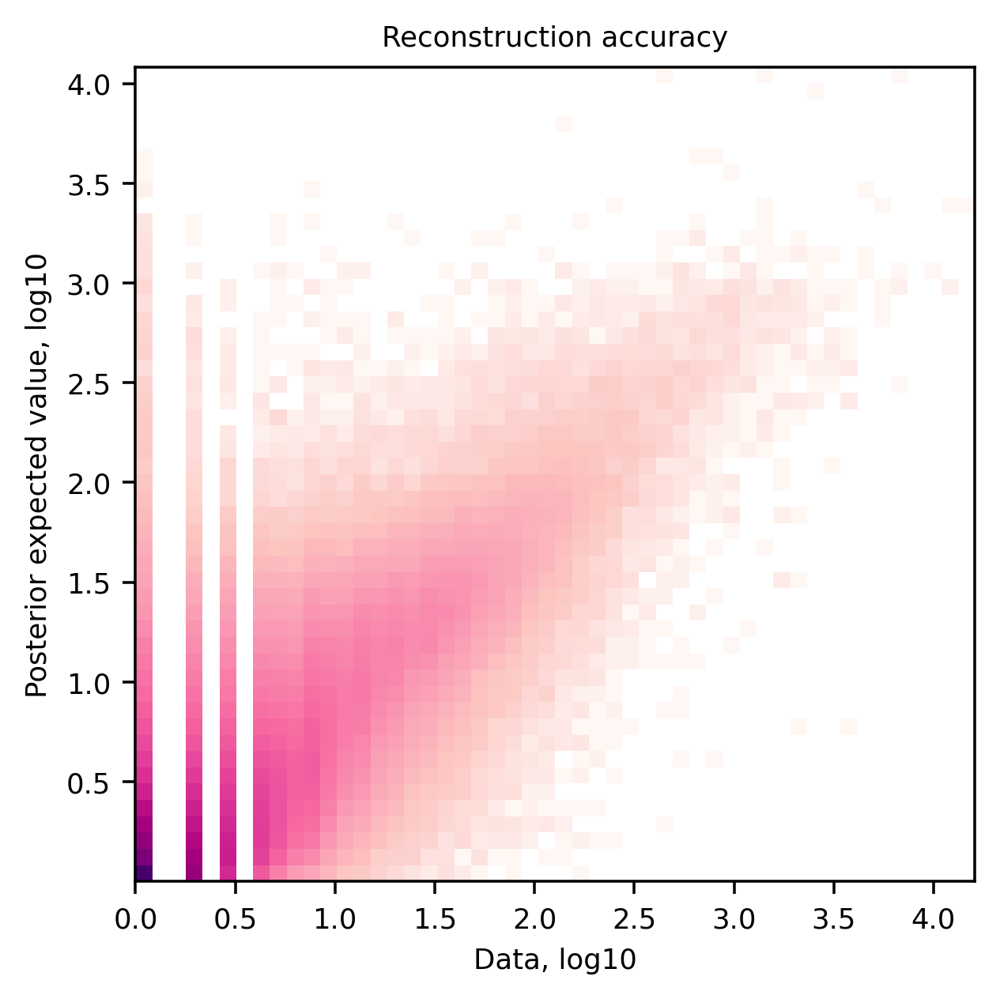

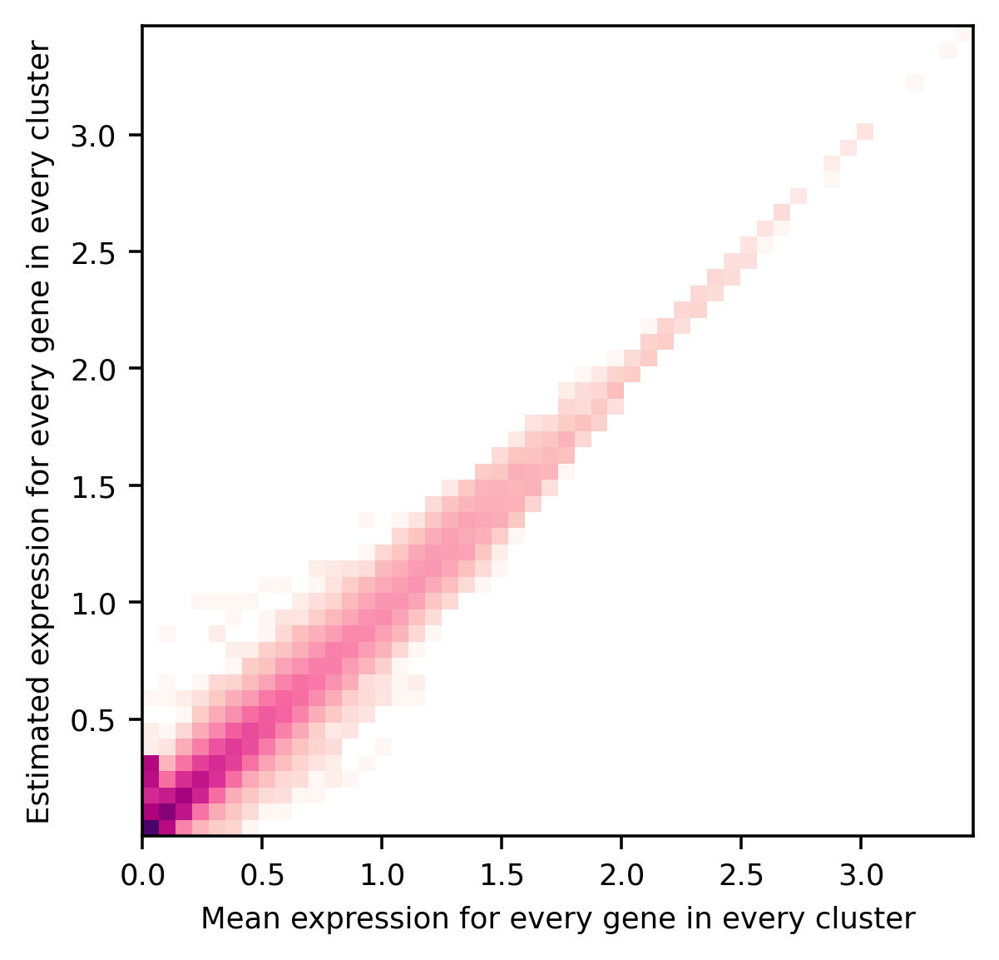

In [22]:
mod.plot_QC()

### Extract reference cell types signatures as a `pandas` dataframe

In [23]:
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]

,AT2 proliferating,Adventitial fibroblasts,Alveolar fibroblasts,Alveolar macrophages,B cells
TSPAN6,0.185415,0.131168,0.088046,0.008163,0.003225
TNMD,0.964751,0.410134,0.828166,0.223309,0.904865
DPM1,0.632877,0.366551,0.126632,0.379030,0.091601
SCYL3,0.083490,0.041629,0.023264,0.040960,0.011744
FGR,0.058612,0.030808,0.006815,1.761534,0.056358


### Spatial mapping with `cell2location`

- Find shared genes and subset both anndata and reference signatures

In [24]:
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

In [25]:
from cell2location.models import Cell2location
Cell2location.setup_anndata(adata = adata_vis, batch_key = "sample")

mod = Cell2location(
    adata_vis, cell_state_df = inf_aver,
    N_cells_per_location = 30,
    detection_alpha = 200
)
mod.view_anndata_setup()

mod.train(
    max_epochs = 30000,
    batch_size = None,
    train_size = 1,
)

Anndata setup with scvi-tools version 0.19.0.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 1956  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 13657 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                      batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃    Categories    ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │ 6332STDY10289520 │          0          │
└─────────────────────┴──────────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cartalop/mambaforge/envs/c2l/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/cartalop/mambaforge/envs/c2l/lib/python3.9/site-packages/pytorch_lightning/trainer/trainer.py:1892: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 30000/30000: 100%|██████████| 30000/30000 [22:00<00:00, 22.76it/s, v_num=1, elbo_train=1.98e+7]

`Trainer.fit` stopped: `max_epochs=30000` reached.


Epoch 30000/30000: 100%|██████████| 30000/30000 [22:00<00:00, 22.72it/s, v_num=1, elbo_train=1.98e+7]


- Plot ELBO loss history during training, removing first 100 epochs from the plot

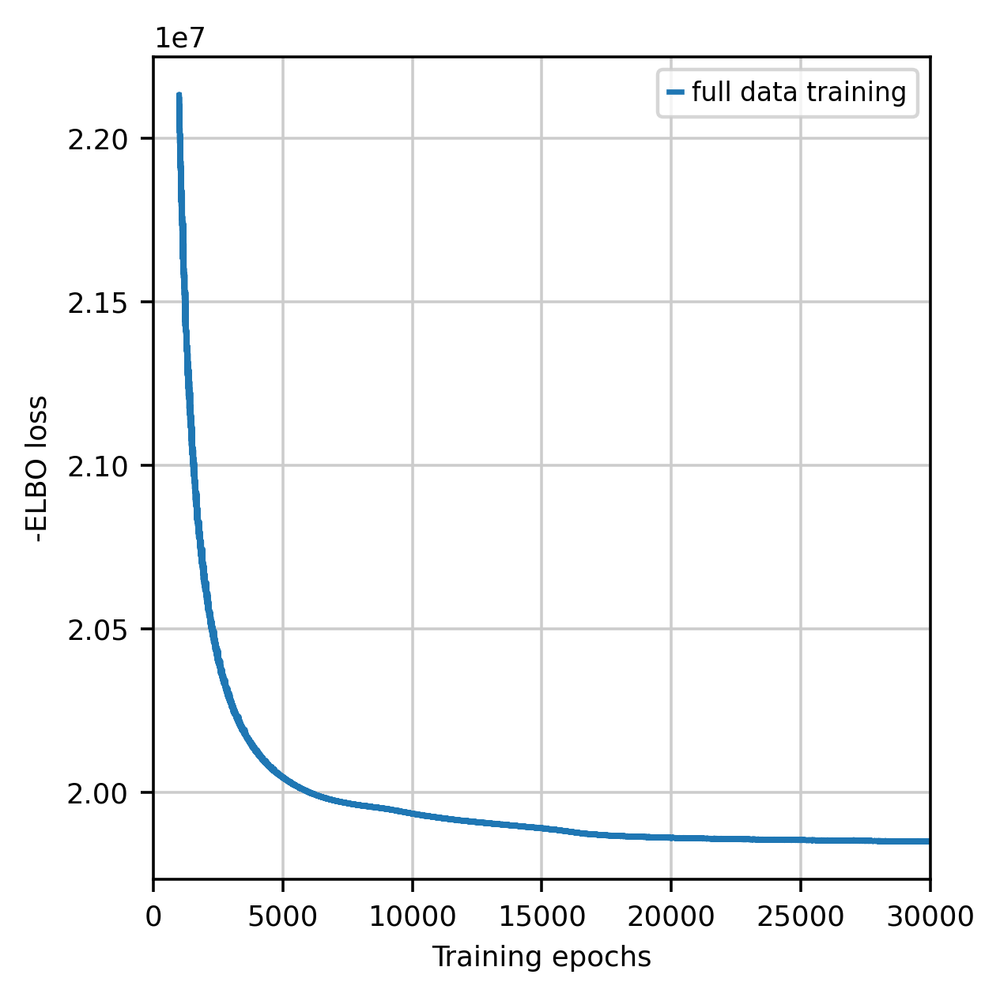

In [26]:
mod.plot_history(1000)
plt.legend(labels = ['full data training']);

### Exporting estimated posterior distributions of cell abundance and saving results

In [27]:
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs = {'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': True}
)

Sampling global variables, sample: 100%|██████████| 999/999 [00:09<00:00, 109.95it/s]


In [28]:
mod.save(f"{run_name}", overwrite = True)

### Save `anndata` object with results

In [29]:
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)
adata_file

'/home/cartalop/data/carlos/single_cell/autotalker/public_datasets/meyer_lung/c2l//cell2location_map/sp.h5ad'

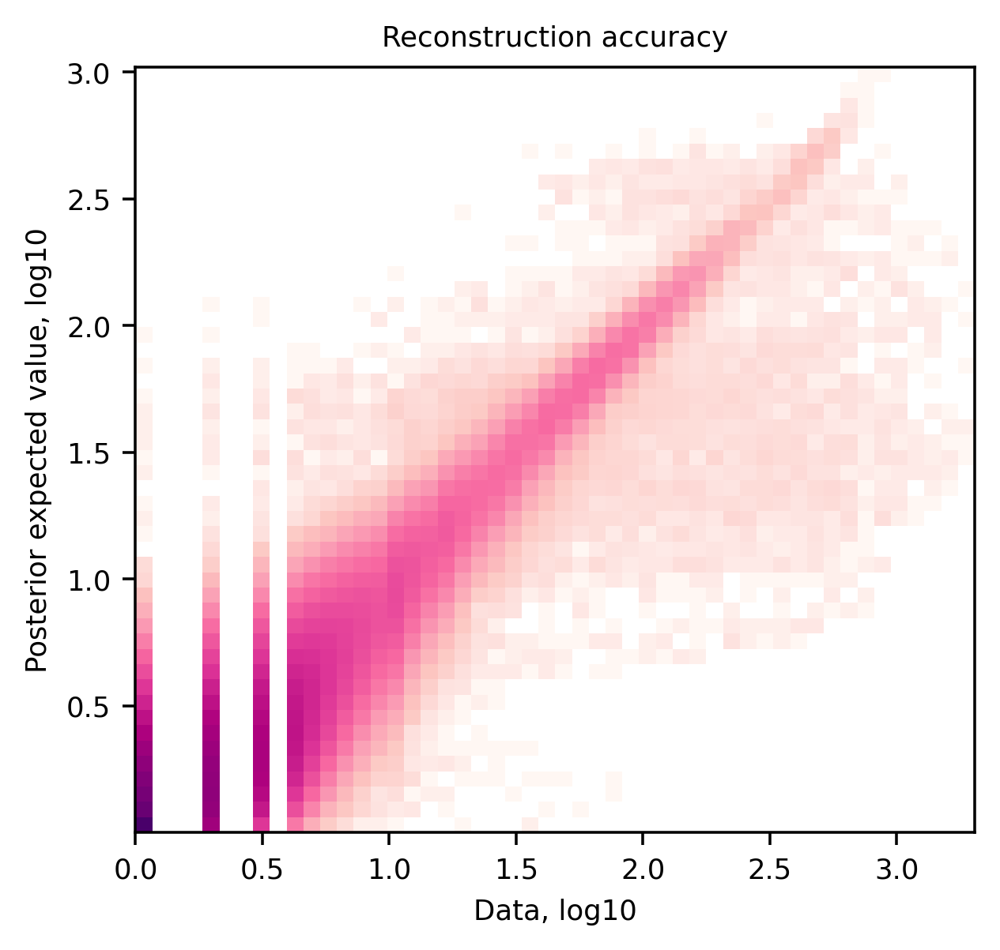

In [30]:
mod.plot_QC()

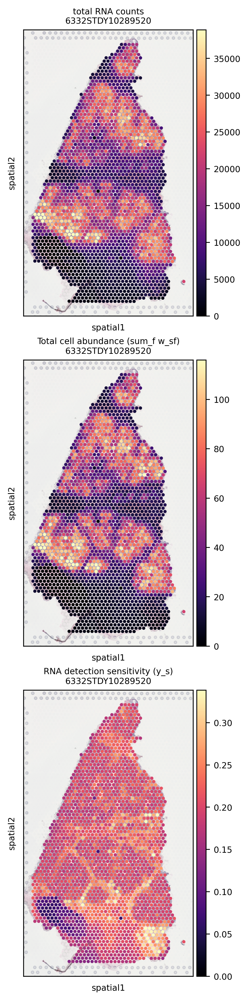

In [31]:
fig = mod.plot_spatial_QC_across_batches()

### Visualising cell abundance in spatial coordinates

- Add 5% quantile, representing confident cell abundance, 'at least this amount is present', to `adata.obs` with cell names for plotting

In [32]:
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

In [33]:
#from cell2location.utils import select_slide
#slide = select_slide(adata_vis, 'V1_Human_Lymph_Node')

slide = adata_vis.copy()

In [34]:
slide

AnnData object with n_obs × n_vars = 1956 × 13657
    obs: 'in_tissue', 'array_row', 'array_col', 'clusters', 'annotation', 'SLT: Alveolar fibro', 'SLT: Interm fibro', 'SLT: Mid fibro', 'SLT: Pericyte', 'SLT: Adventitial fibro', 'SLT: Vascular SMC 1', 'SLT: Myofibro 3', 'SLT: Vascular SMC 2', 'SLT: Airway fibro', 'SLT: Late mesothelial', 'SLT: Myofibro 2', 'SLT: Myofibro 1', 'SLT: SEMA3E+ mid fibro', 'SLT: Late airway SMC', 'SLT: Early airway SMC 1', 'SLT: Resting chondrocyte', 'SLT: ASPN+ chondrocyte', 'SLT: Interm chondrocyte', 'SLT: Early airway SMC 2', 'SLT: Mid mesothelial', 'SLT: SEMA3E+ early fibro', 'SLT: Late tip', 'SLT: Club', 'SLT: Late airway progenitor', 'SLT: Squamous', 'SLT: AT1', 'SLT: AT2', 'SLT: Secretory 2', 'SLT: SMG', 'SLT: Late stalk', 'SLT: Secretory 3', 'SLT: Pulmonary neuroendocrine', 'SLT: Proximal basal', 'SLT: Secretory 1', 'SLT: GHRL+ neuroendocrine', 'SLT: NEUROD1+ pulmonary neuroendocrine', 'SLT: Secretory progenitors', 'SLT: Late basal', 'SLT: Mid basal'

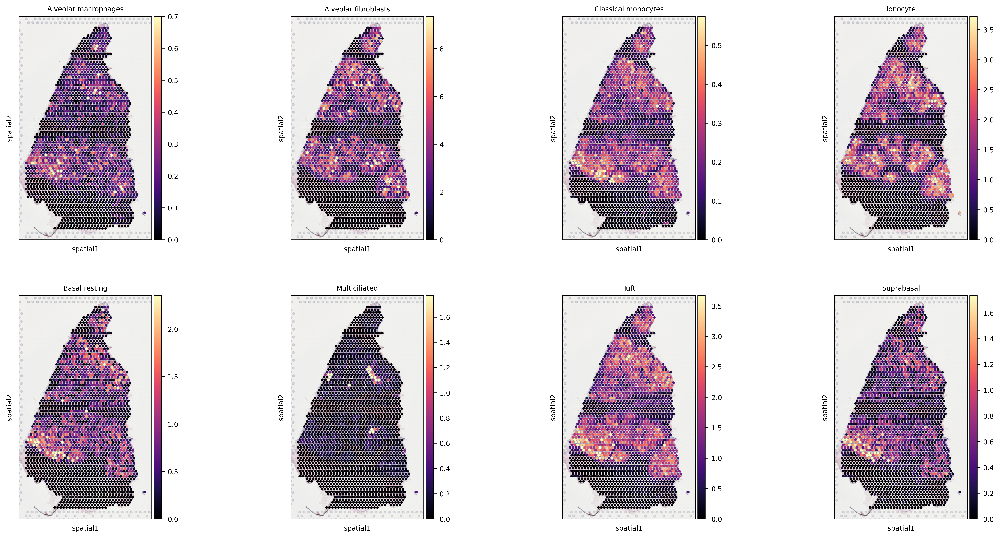

In [38]:
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    colors = ['Alveolar macrophages', 'Alveolar fibroblasts', 'Classical monocytes', 'Ionocyte', 'Basal resting', 'Multiciliated', 'Tuft', 'Suprabasal']
    sc.pl.spatial(
        slide,
        cmap = 'magma',
        # show first 8 cell types
        color = colors,
        ncols = 4,
        size = 1.3,
        img_key = 'hires',
        # limit color scale at 99.2% quantile of cell abundance
        vmin = 0,
        vmax = 'p99.2'
    )

### Plot multiple cell types in one panel

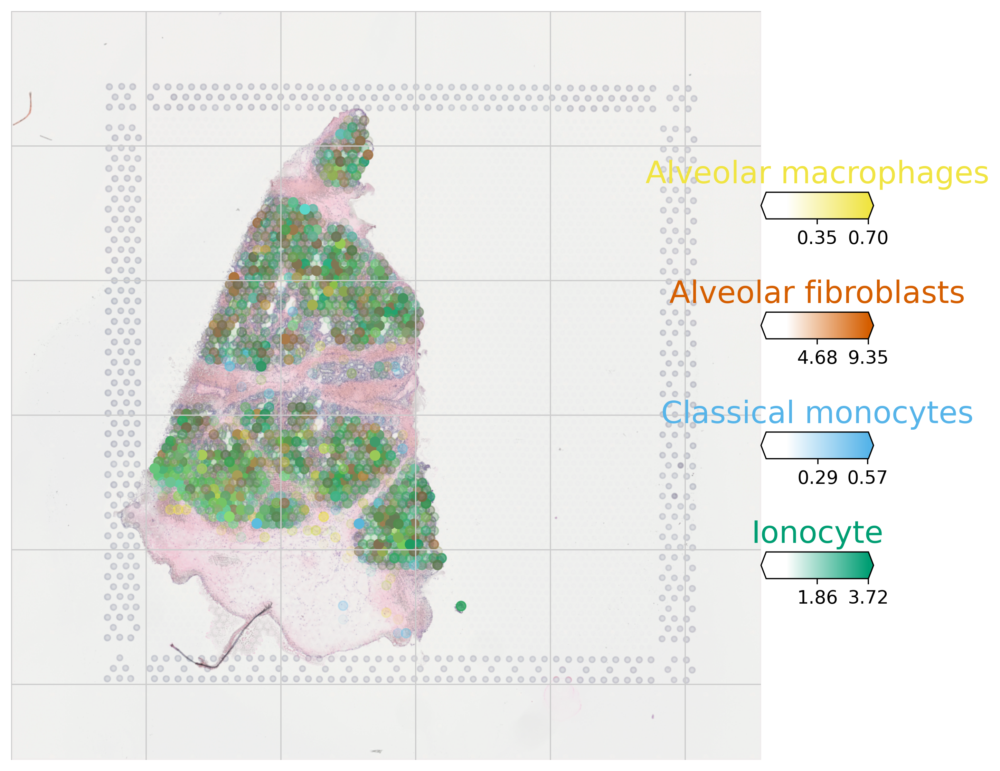

In [40]:
from cell2location.plt import plot_spatial

clust_labels = ['Alveolar macrophages', 'Alveolar fibroblasts', 'Classical monocytes', 'Ionocyte']
clust_col = ['' + str(i) for i in clust_labels]

with mpl.rc_context({'figure.figsize': (10, 10)}):
    fig = plot_spatial(
        adata = slide,
        color = clust_col, labels = clust_labels,
        show_img = True,
        style = 'fast',
        max_color_quantile = 0.992,
        circle_diameter = 6,
        colorbar_position = 'right'
    )

In [41]:
slide

AnnData object with n_obs × n_vars = 1956 × 13657
    obs: 'in_tissue', 'array_row', 'array_col', 'clusters', 'annotation', 'SLT: Alveolar fibro', 'SLT: Interm fibro', 'SLT: Mid fibro', 'SLT: Pericyte', 'SLT: Adventitial fibro', 'SLT: Vascular SMC 1', 'SLT: Myofibro 3', 'SLT: Vascular SMC 2', 'SLT: Airway fibro', 'SLT: Late mesothelial', 'SLT: Myofibro 2', 'SLT: Myofibro 1', 'SLT: SEMA3E+ mid fibro', 'SLT: Late airway SMC', 'SLT: Early airway SMC 1', 'SLT: Resting chondrocyte', 'SLT: ASPN+ chondrocyte', 'SLT: Interm chondrocyte', 'SLT: Early airway SMC 2', 'SLT: Mid mesothelial', 'SLT: SEMA3E+ early fibro', 'SLT: Late tip', 'SLT: Club', 'SLT: Late airway progenitor', 'SLT: Squamous', 'SLT: AT1', 'SLT: AT2', 'SLT: Secretory 2', 'SLT: SMG', 'SLT: Late stalk', 'SLT: Secretory 3', 'SLT: Pulmonary neuroendocrine', 'SLT: Proximal basal', 'SLT: Secretory 1', 'SLT: GHRL+ neuroendocrine', 'SLT: NEUROD1+ pulmonary neuroendocrine', 'SLT: Secretory progenitors', 'SLT: Late basal', 'SLT: Mid basal'